# Exploratory Data Analysis on Sensor Data for each participant

Our main goal is to understand information about:
- Missingness patterns on the dataset
- A light imputed version of the data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
pd.set_option('display.max_columns', None)

In [2]:
# Load CSV file
# We skip 31 rows because of the metadata that each csv contains

df = pd.read_csv(r"C:\Users\berny\Documents\tiktok\5.1 IAD TikTok-1\Sensor Data\003_OscarAlejandroGarciaMendoza.csv", skiprows=31)
df.head()

C:\Users\berny\AppData\Local\Temp\ipykernel_12804\2383090204.py:4: DtypeWarning: Columns (3,4,6) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r"C:\Users\berny\Documents\tiktok\5.1 IAD TikTok-1\Sensor Data\003_OscarAlejandroGarciaMendoza.csv", skiprows=31)


,Row,Timestamp,EventSource,SlideEvent,StimType,Duration,CollectionPhase,SourceStimuliName,EventSource.1,SampleNumber,Anger,Contempt,Disgust,Fear,Joy,Sadness,Surprise,Engagement,Adaptive Engagement,Valence,Adaptive Valence,Sentimentality,Confusion,Neutral,Attention,Brow Furrow,Brow Raise,Cheek Raise,Chin Raise,Dimpler,Eye Closure,Eye Widen,Inner Brow Raise,Jaw Drop,Lip Corner Depressor,Lip Press,Lip Pucker,Lip Stretch,Lip Suck,Lid Tighten,Mouth Open,Nose Wrinkle,Smile,Smirk,Upper Lip Raise,Blink,BlinkRate,Speaking,Pitch,Yaw,Roll,Interocular Distance,EventSource.2,SampleNumber.1,width,height,feature id_1,feature-x_1,feature-y_1,feature id_2,feature-x_2,feature-y_2,feature id_3,feature-x_3,feature-y_3,feature id_4,feature-x_4,feature-y_4,feature id_5,feature-x_5,feature-y_5,feature id_6,feature-x_6,feature-y_6,EventSource.3,CPU Sys,Memory Sys,CPU Proc,Memory Proc,EventSource.4,Anger.1,Contempt.1,Disgust.1,Fear.1,Joy.1,Sadness.1,Surprise.1,Engagement.1,Adaptive Engagement.1,Positive Valence,Negative Valence,Neutral Valence,Positive Adaptive Valence,Negative Adaptive Valence,Neutral Adaptive Valence,Sentimentality.1,Confusion.1,Neutral.1,Attention.1,Brow Furrow.1,Brow Raise.1,Cheek Raise.1,Chin Raise.1,Dimpler.1,Eye Closure.1,Eye Widen.1,Inner Brow Raise.1,Jaw Drop.1,Lip Corner Depressor.1,Lip Press.1,Lip Pucker.1,Lip Stretch.1,Lip Suck.1,Lid Tighten.1,Mouth Open.1,Nose Wrinkle.1,Smile.1,Smirk.1,Upper Lip Raise.1,Speaking.1,Head Pointing Up,Head Pointing Down,Head Pointing Forward,Head Turned Right,Head Turned Left,Head Turned Forward,Head Tilted Left,Head Tilted Right,Head Not Tilted,Head Leaning Forward,Head Leaning Backward,EventSource.5,GSR Raw,GSR Interpolated,Tonic Signal,Phasic Signal,Peak Detected,Peak Amplitude,Peak Occurrences,Signal Interpolation,EventSource.6,SampleNumber.2,Timestamp RAW,Timestamp CAL,System Timestamp CAL,Wide Range Accelerometer X RAW,Wide Range Accelerometer X CAL,Wide Range Accelerometer Y RAW,Wide Range Accelerometer Y CAL,Wide Range Accelerometer Z RAW,Wide Range Accelerometer Z CAL,VSenseBatt RAW,VSenseBatt CAL,Internal ADC A13 PPG RAW,Internal ADC A13 PPG CAL,GSR RAW,GSR Resistance CAL,GSR Conductance CAL,Heart Rate PPG ALG,IBI PPG ALG,Packet reception rate RAW
0,1,29.0002,1.0,StartSlide,TestImage,900000.0,StimuliDisplay,Screen recording 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,34.0625,NaN,NaN,NaN,NaN,NaN,Screen recording 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.323898,0.323898,0.323898,0.0,0.0,0.0,0.0,0.0,1.0,193926.0,3843576.0,1.515047e+06,1.747324e+12,-2428.0,6.199282,10359.0,1.453022,-13948.0,8.347098,2550.0,3713.846154,2528.0,1852.014652,50564.0,3087.388622,0.323898,192.0,-1.0,99.0
2,3,41.8750,NaN,NaN,NaN,NaN,NaN,Screen recording 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

### Main insights

In [3]:
print(f'We are working with {len(df.columns)} features')
print(f'Each feature contains {len(df)} rows')

We are working with 161 features
Each feature contains 142940 rows


In [4]:
df.describe()

,Row,Timestamp,EventSource,Duration,EventSource.1,SampleNumber,Anger,Contempt,Disgust,Fear,Joy,Sadness,Surprise,Engagement,Adaptive Engagement,Valence,Adaptive Valence,Sentimentality,Confusion,Neutral,Attention,Brow Furrow,Brow Raise,Cheek Raise,Chin Raise,Dimpler,Eye Closure,Eye Widen,Inner Brow Raise,Jaw Drop,Lip Corner Depressor,Lip Press,Lip Pucker,Lip Stretch,Lip Suck,Lid Tighten,Mouth Open,Nose Wrinkle,Smile,Smirk,Upper Lip Raise,Blink,BlinkRate,Speaking,Pitch,Yaw,Roll,Interocular Distance,EventSource.2,SampleNumber.1,width,height,feature id_1,feature-x_1,feature-y_1,feature id_2,feature-x_2,feature-y_2,feature id_3,feature-x_3,feature-y_3,feature id_4,feature-x_4,feature-y_4,feature id_5,feature-x_5,feature-y_5,feature id_6,feature-x_6,feature-y_6,EventSource.3,CPU Sys,Memory Sys,CPU Proc,Memory Proc,EventSource.4,Anger.1,Contempt.1,Disgust.1,Fear.1,Joy.1,Sadness.1,Surprise.1,Engagement.1,Adaptive Engagement.1,Positive Valence,Negative Valence,Neutral Valence,Positive Adaptive Valence,Negative Adaptive Valence,Neutral Adaptive Valence,Sentimentality.1,Confusion.1,Neutral.1,Attention.1,Brow Furrow.1,Brow Raise.1,Cheek Raise.1,Chin Raise.1,Dimpler.1,Eye Closure.1,Eye Widen.1,Inner Brow Raise.1,Jaw Drop.1,Lip Corner Depressor.1,Lip Press.1,Lip Pucker.1,Lip Stretch.1,Lip Suck.1,Lid Tighten.1,Mouth Open.1,Nose Wrinkle.1,Smile.1,Smirk.1,Upper Lip Raise.1,Speaking.1,Head Pointing Up,Head Pointing Down,Head Pointing Forward,Head Turned Right,Head Turned Left,Head Turned Forward,Head Tilted Left,Head Tilted Right,Head Not Tilted,Head Leaning Forward,Head Leaning Backward,EventSource.5,GSR Raw,GSR Interpolated,Tonic Signal,Phasic Signal,Peak Detected,Peak Amplitude,Peak Occurrences,Signal Interpolation,EventSource.6,SampleNumber.2,Timestamp RAW,Timestamp CAL,System Timestamp CAL,Wide Range Accelerometer X RAW,Wide Range Accelerometer X CAL,Wide Range Accelerometer Y RAW,Wide Range Accelerometer Y CAL,Wide Range Accelerometer Z RAW,Wide Range Accelerometer Z CAL,VSenseBatt RAW,VSenseBatt CAL,Internal ADC A13 PPG RAW,Internal ADC A13 PPG CAL,GSR RAW,GSR Resistance CAL,GSR Conductance CAL,Heart Rate PPG ALG,IBI PPG ALG,Packet reception rate RAW
count,142940.000000,142940.000000,4.0,4.0,27008.0,27008.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,2.699200e+04,26992.000000,2.699200e+04,26992.000000,26992.000000,26992.000000,2.699200e+04,2.699200e+04,2.699200e+04,2.699200e+04,2.699200e+04,2.699200e+04,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,26688.000000,26992.000000,26992.000000,26992.000000,26992.000000,26992.000000,27008.0,27008.000000,27008.0,27008.0,26992.0,26992.000000,26992.000000,26992.0,26992.000000,26992.000000,26992.0,26992.000000,26992.000000,26992.0,26992.000000,26992.000000,26992.0,26992.000000,26992.000000,26992.0,26992.000000,26992.000000,886.0,886.000000,886.000000,886.000000,886.000000,27008.0,27008.0,27008.000000,27008.000000,27008.000000,27008.000000,27008.0,27008.000000,27008.000000,27008.000000,27008.000000,27008.00000,27008.000000,27008.000000,27008.0,27008.000000,27008.0,27008.0,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,27008.000000,115293.0,114954.000000,115293.000000,115293.000000,1.152930e+05,115293.000000,115293.000000,115293.000000,115293.000000,114954.0,114954.000000,1.149540e+05,1.149540e+05,1.149540e+05,114954.000000,114954.000000,114954.000000,114954.000000,114954.000000,114954.000000,114954.00000

### Understanding the missingness of the data

Missing-value summary

In [5]:
missing_percentage = df.isna().mean().sort_values(ascending=False)
print(missing_percentage)

EventSource          0.999972
SlideEvent           0.999972
StimType             0.999972
Duration             0.999972
CollectionPhase      0.999972
                       ...   
GSR Interpolated     0.193417
EventSource.5        0.193417
Timestamp            0.000000
SourceStimuliName    0.000000
Row                  0.000000
Length: 161, dtype: float64


Only `Timestamp`, `SourceStimuliName` and `Row` contain no missing values

We are working with a set with the vast majority of missing values

Let us try to see row-wise blocks of missingness using a heatmap

<Axes: >

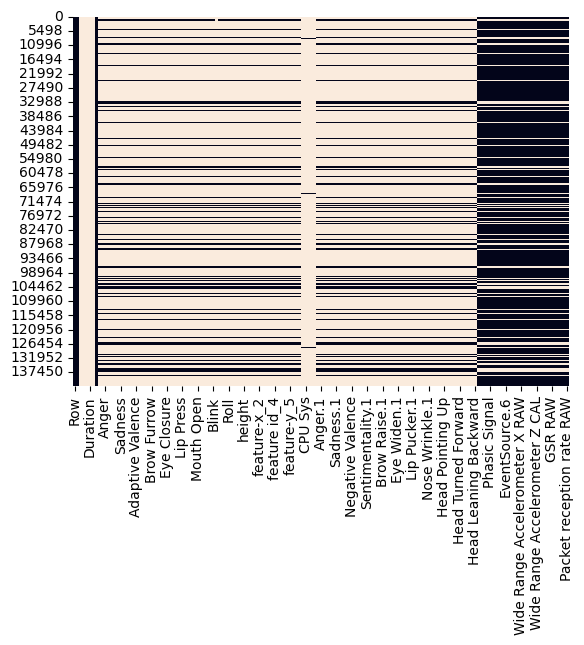

In [6]:
sns.heatmap(df.isna(), cbar=False)

### Data collection issues

From this heatmap we can observe two main blocks corresponding to each of the equipment used.

It is fairly interesting to see that when Facial equipment measures, GSR equipment does not and viceversa.

This is probably because the way iMotions equipment is programmed, it only accepts readings from one equipment at a specific time. I think the laboratory should have the measurings of equipments in a parallel manner so each timestamp can contain values from all equipments.

### Missingness correlation

In [7]:
# Compute missingness correlation matrix
corr = df.isna().corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Creating a big figure
plt.figure(figsize=(50, 50), dpi=1000)

# Draw the heatmap
sns.heatmap(corr,
            mask = mask,
            cmap=cmap,
            cbar_kws={'shrink': 0.5},
            xticklabels=True,
            yticklabels=True)

# Rotate tick labels for readability
plt.xticks(rotation=90, fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.tight_layout()
plt.show()

Let us try to understand the data we are working with:

### 1. Row & Timing:
- Row:  
    - Sequential index of the exported row.
- Timestamp (iMotions_Synchronization_Timestamp)
    - Milliseconds since the start of recording—use to align all streams.


### 2. Slide/Stimulus Events (SlideEvents)

| Column                    | What it means                                                |
| ------------------------- | ------------------------------------------------------------ |
| **SE\_SlideEvent**        | Type of slide event (e.g. “Start”, “Stop”)                   |
| **SE\_StimulusType**      | What kind of stimulus was shown (e.g. image, video)          |
| **SE\_Duration**          | How long that stimulus ran (e.g. video length, in ms)        |
| **SE\_CollectionPhase**   | Experiment phase label (e.g. “Baseline”, “Task”)             |
| **SE\_SourceStimuliName** | Name or identifier of the stimulus (e.g. “TikTok\_Clip\_01”) |

### 3. Facial-Expression Analysis (Affectiva AFFDEX)

| Column                                                              | Description                                                                |
| ------------------------------------------------------------------- | -------------------------------------------------------------------------- |
| **Imotions\_Sample\_Counter\_Affectiva\_AFFDEX**                    | Frame counter from the Affectiva engine.                                   |
| **FEA\_Emotion\_…**                                                 | Confidence scores (0–100) for each emotion:                                |
| • Anger, Contempt, Disgust, Fear, Joy, Sadness, Surprise            |                                                                            |
| • Engagement, Adaptive Engagement                                   |                                                                            |
| • Valence, Adaptive Valence                                         |                                                                            |
| • Sentimentality, Confusion, Neutral                                |                                                                            |
| • Attention (focus level)                                           |                                                                            |
| **FEA\_Action\_Unit\_…**                                            | Facial Action Unit intensities (0–100) for muscle movements:               |
| Brow Furrow, Brow Raise, Cheek Raise, Chin Raise, Dimpler,          |                                                                            |
| Eye Closure, Eye Widen, Inner Brow Raise, Jaw Drop,                 |                                                                            |
| Lip Corner Depressor, Lip Press, Lip Pucker, Lip Stretch, Lip Suck, |                                                                            |
| Lid Tighten, Mouth Open, Nose Wrinkle, Smile, Smirk,                |                                                                            |
| Upper Lip Raise, Blink, BlinkRate, Speaking                         |                                                                            |
| **FEA\_Head\_Rotation\_…**                                          | Head pose angles (degrees): Pitch (up/down), Yaw (left/right), Roll (tilt) |
| **FEA\_Other\_Interocular\_Distance**                               | Distance between eyes (pixels)                                             |

### 4. Facial-Landmarks (Affectiva AFFDEX Landmarks)

| Columns                                          | Meaning                                  |
| ------------------------------------------------ | ---------------------------------------- |
| **FEA\_Other\_Camera\_Resolution\_Width/Height** | Video frame size (px)                    |
| \*\*FEA\_Landmark\_*\_X, *\_Y**                  | (x,y) coordinates of detected landmarks: |
| • Facebox corners (top-left, bottom-right)       |                                          |
| • Outer Right/Left Eye                           |                                          |
| • Nose Tip                                       |                                          |
| • Chin Tip                                       |                                          |

### 5. System Load (iMotions.SysMonitor SysLoadMeter)

| Column                | Unit | What it tracks                   |
| --------------------- | ---- | -------------------------------- |
| **Api\_CPU\_Sys**     | %    | Total CPU usage of the machine   |
| **Api\_Memory\_Sys**  | MB   | Total RAM usage                  |
| **Api\_CPU\_Proc**    | %    | CPU used by the iMotions process |
| **Api\_Memory\_Proc** | MB   | RAM used by the iMotions process |

### 6. Thresholded Facial Signals (R Analysis FEA thresholding)

Binary flags (0/1) indicating when each emotion/behavior crosses your set thresholds:
Anger, Contempt, Disgust, Fear, Joy, Sadness, Surprise, Engagement, Adaptive Engagement,
Positive/Negative/Neutral Valence, Sentimentality, Confusion, Neutral Expression, Attention,
Brow Furrow, … , Speaking, Head-pointing/titled states.

### 7. GSR Peak Detection (R Analysis GSR Peak Detection)

| Column                           | Unit  | What it tells you                 |
| -------------------------------- | ----- | --------------------------------- |
| **GSR\_PD\_Raw**                 | µS    | Raw skin conductance              |
| **GSR\_PD\_Interpolated**        | µS    | After interpolating short gaps    |
| **GSR\_PD\_TonicSignal**         | µS    | Slow-varying (baseline) component |
| **GSR\_PD\_PhasicSignal**        | µS    | Fast-varying (peaks) component    |
| **GSR\_PD\_PeakDetected**        | 0/1   | 1 when in a detected peak         |
| **GSR\_PD\_PeakAmplitude**       | µS    | Peak height above onset           |
| **GSR\_PD\_PeakOccurrences**     | count | Number of peaks detected so far   |
| **GSR\_PD\_SignalInterpolation** | 0/1   | 1 when value is interpolated      |

### 8. Shimmer GSR & Other Biosignals (Shimmer3-FD27)

| Column                                            | Unit  | Meaning                                        |
| ------------------------------------------------- | ----- | ---------------------------------------------- |
| **Imotions\_Sample\_Counter\_Shimmer1\_GSR**      | index | Sample counter from the Shimmer device         |
| **Other\_Timestamp\_RAW/CAL\_Shimmer1**           | ms    | Shimmer’s raw and calibrated timestamps        |
| **Accelerometer\_\*\_RAW/CAL\_Shimmer1**          | m/s²  | X, Y, Z accelerometer (raw ADC vs. calibrated) |
| **VSensebatt\_RAW/CAL\_Shimmer1**                 | mV    | Battery voltage                                |
| **PPG\_Blood\_Volumepulse\_RAW/CAL\_Shimmer1**    | mV    | Photoplethysmography signal                    |
| **GSR\_RAW\_Shimmer1**                            | kΩ    | Skin resistance                                |
| **GSR\_Resistance/CAL\_Shimmer1**                 | kΩ/µS | Calibrated resistance & conductance            |
| **PPG\_Metric\_Heart\_Rate\_Shimmer1**            | bpm   | Beats per minute (from PPG)                    |
| **PPG\_Metric\_Inter\_Beat\_Interval\_Shimmer1**  | ms    | Time between heart beats                       |
| **Other\_Packet\_Reception\_Rate\_RAW\_Shimmer1** | %     | % of packets successfully received             |




### Most relevant features regarding facial equipment are the following:

- Timestamp
- Attention 
- Sentimentality 
- Adaptive Engagement 
- Joy

Our objective is to try and predict adaptive engagement of the user based on the timestamp and other significant features